In [1]:
import scanpy as sc

In [2]:
ad = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_LLM_anno.h5ad')

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")



Processing sample: RB4282


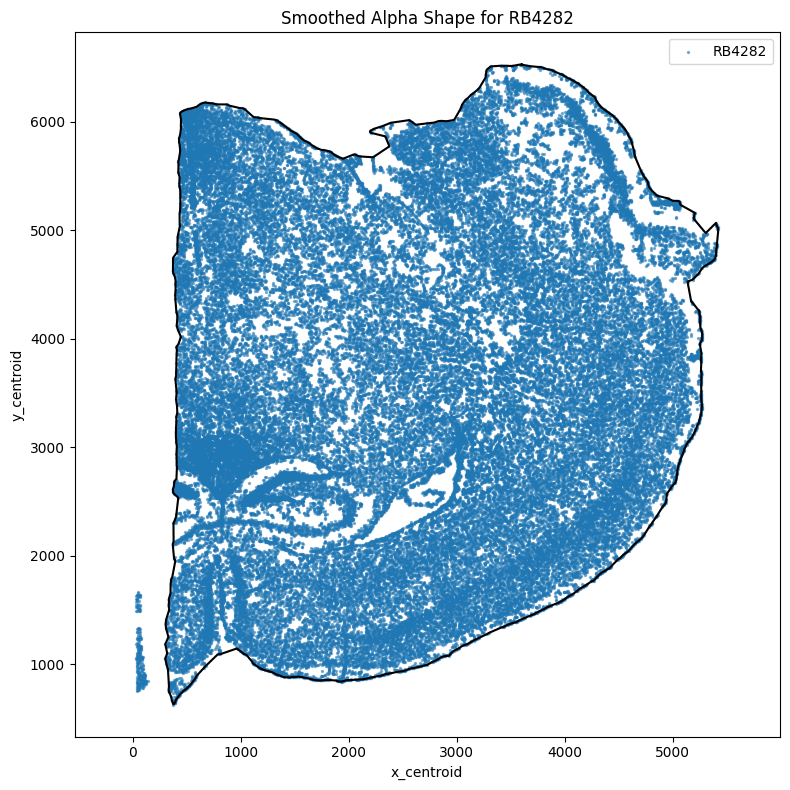


Processing sample: RB4350


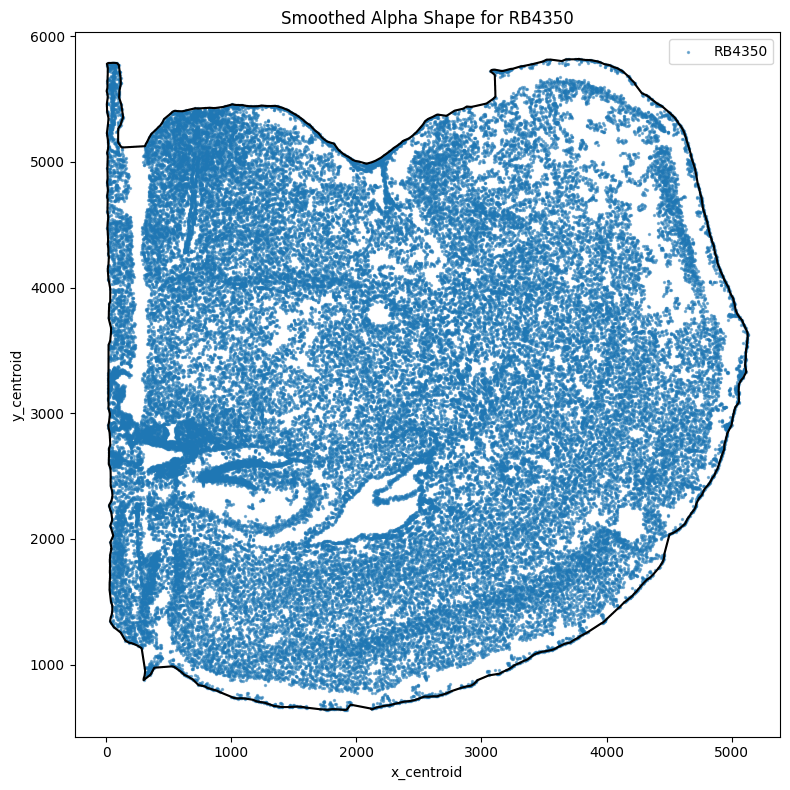


Processing sample: RB4401


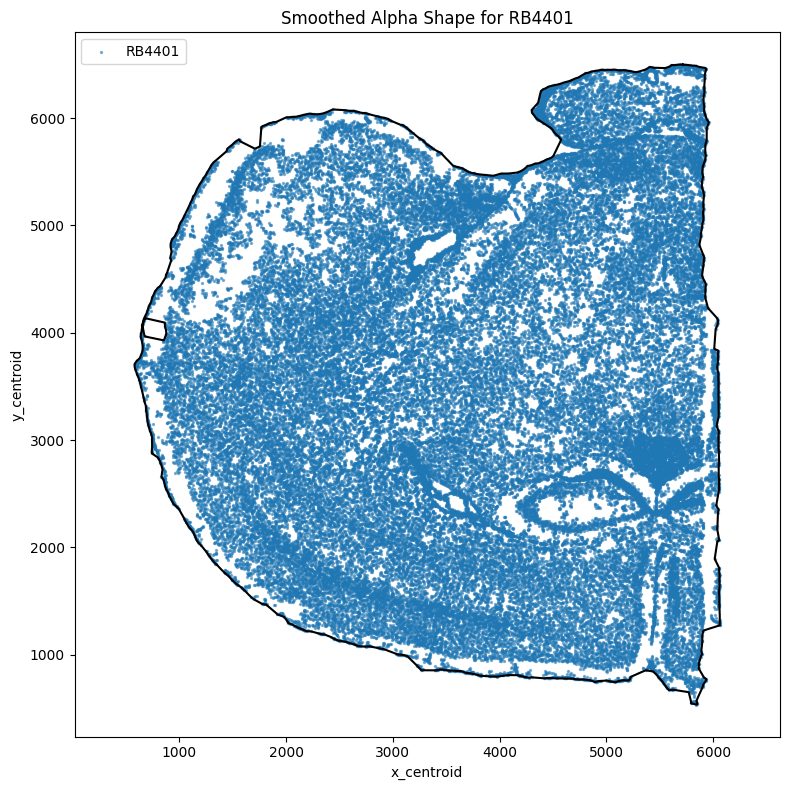


Processing sample: RB4403


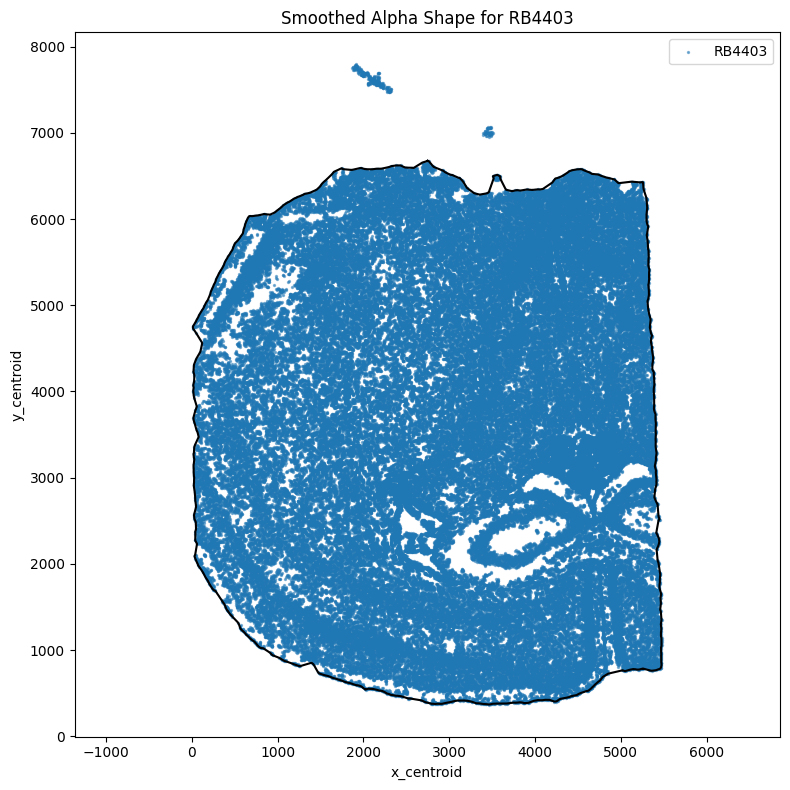


Processing sample: RB4405


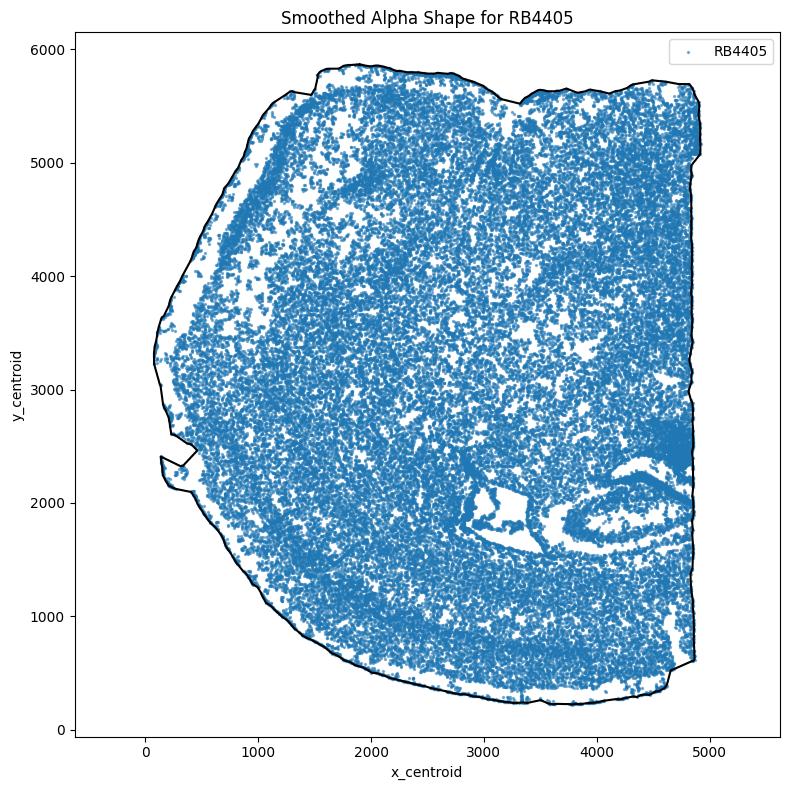


Processing sample: RB4498


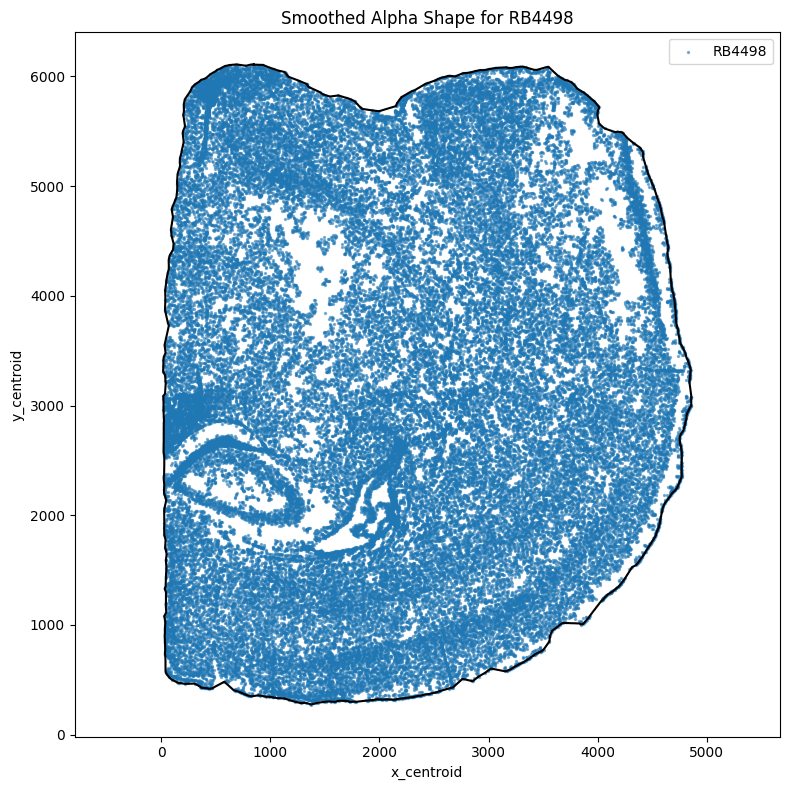


Processing sample: RB4620


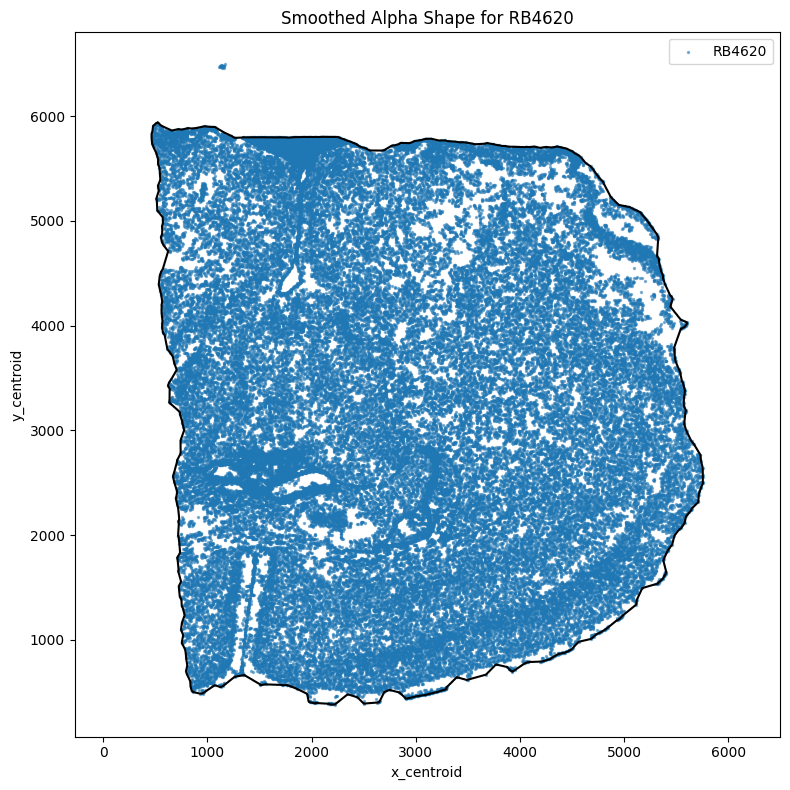


Processing sample: RB4627


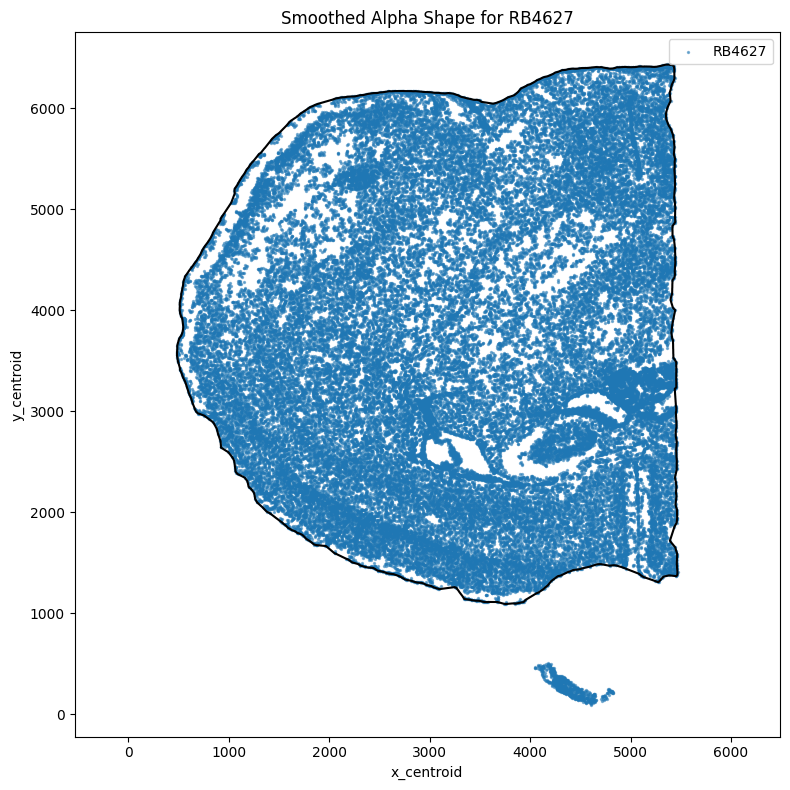


Processing sample: RB4630


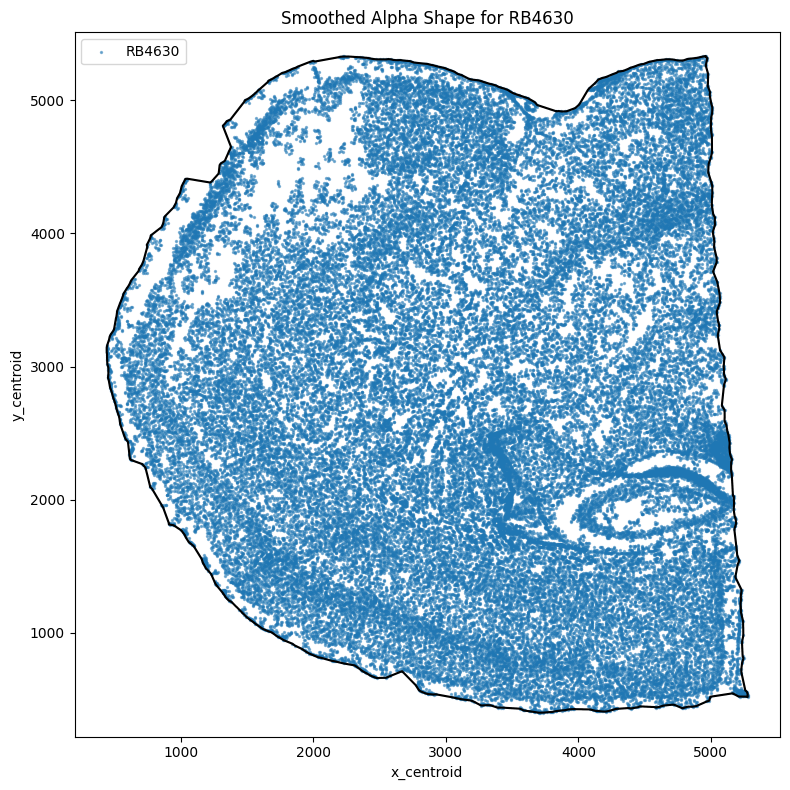


Processing sample: RB4653


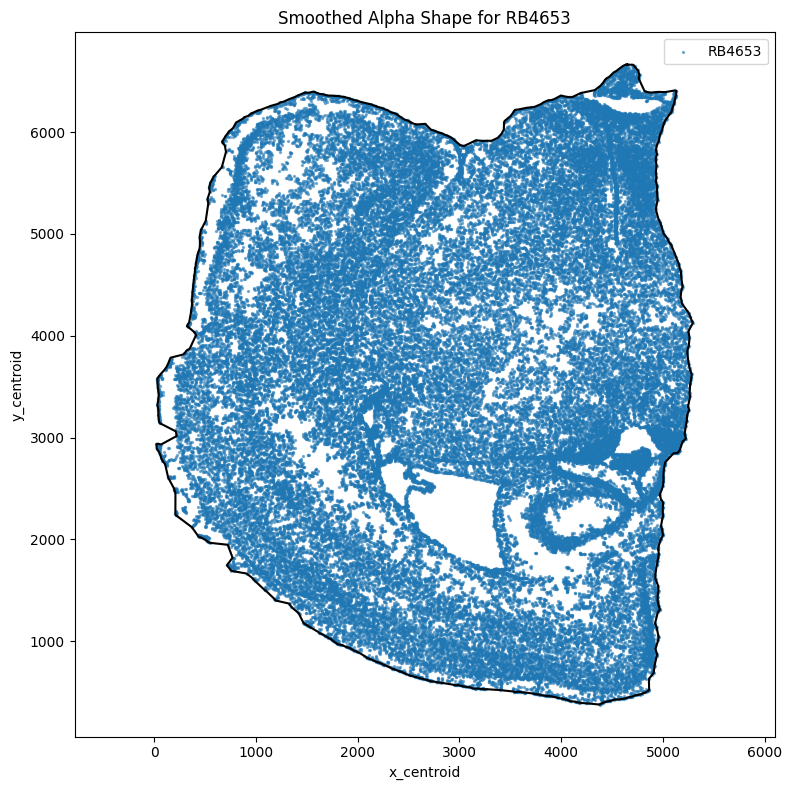


Processing sample: RB4658


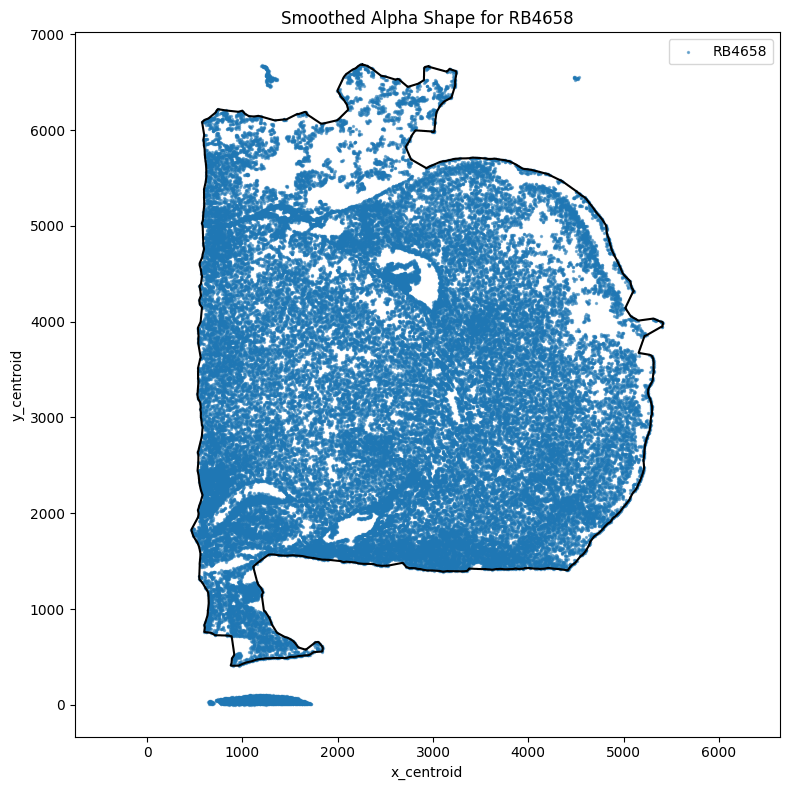


Processing sample: RB4676


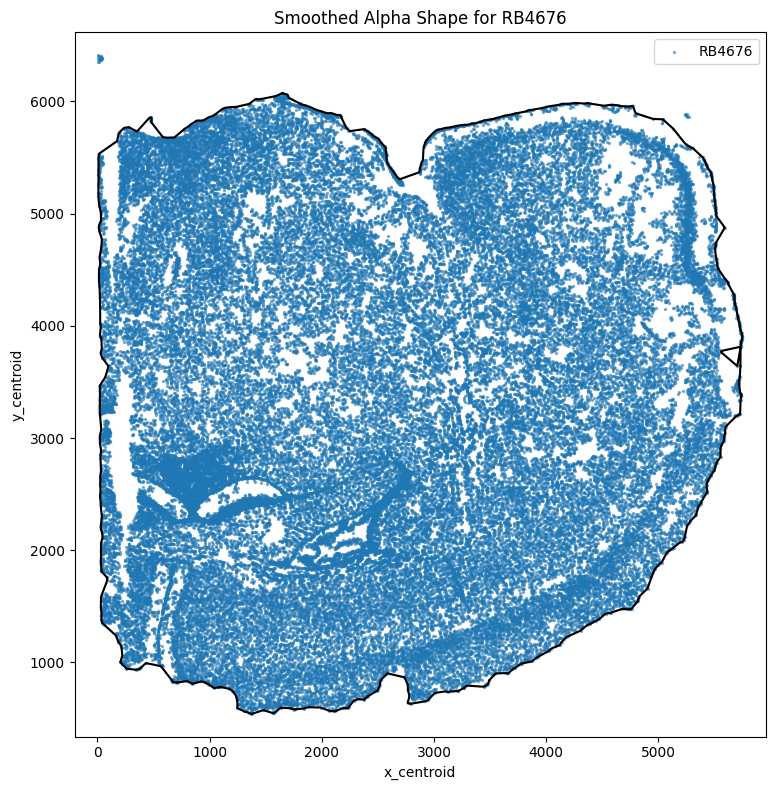

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from shapely.ops import unary_union
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import Delaunay
from scipy.ndimage import binary_closing
from skimage.draw import polygon2mask
from skimage.measure import find_contours

# Your alpha shape + stitching code
def alpha_shape(points, alpha, only_outer=True):
    assert points.shape[0] > 3, "Need at least four points"

    def add_edge(edges, i, j):
        if (i, j) in edges or (j, i) in edges:
            if only_outer:
                edges.remove((j, i) if (j, i) in edges else (i, j))
            return
        edges.add((i, j))

    tri = Delaunay(points)
    edges = set()
    for ia, ib, ic in tri.simplices:
        pa, pb, pc = points[ia], points[ib], points[ic]
        a = np.linalg.norm(pa - pb)
        b = np.linalg.norm(pb - pc)
        c = np.linalg.norm(pc - pa)
        s = (a + b + c) / 2.0
        area = max(np.sqrt(s * (s - a) * (s - b) * (s - c)), 1e-12)
        circum_r = a * b * c / (4.0 * area)
        if circum_r < alpha:
            add_edge(edges, ia, ib)
            add_edge(edges, ib, ic)
            add_edge(edges, ic, ia)
    return edges

def stitch_boundaries(edges):
    edge_set = edges.copy()
    boundary_lst = []
    while len(edge_set) > 0:
        boundary = []
        edge0 = edge_set.pop()
        boundary.append(edge0)
        last_edge = edge0
        while True:
            i, j = last_edge
            j_first = [n for x, n in edge_set if x == j]
            j_second = [n for n, x in edge_set if x == j]
            next_j = j_first or j_second
            if not next_j:
                break
            k = next_j[0]
            edge_set.remove((j, k) if (j, k) in edge_set else (k, j))
            boundary.append((j, k))
            last_edge = (j, k)
            if boundary[0][0] == last_edge[1]:
                break
        boundary_lst.append(boundary)
    return boundary_lst

# Smoothing function
def generate_smoothed_alpha_polygon(coords_filtered, alpha=100, closing_radius=20, img_size=(4096, 4096)):
    edges = alpha_shape(coords_filtered, alpha=alpha, only_outer=True)
    stitched = stitch_boundaries(edges)
    if not stitched:
        return None

    largest_boundary = max(stitched, key=len)
    points = np.array([coords_filtered[i] for i, _ in largest_boundary])
    points = np.vstack([points, points[0]])  # close loop

    x_min, y_min = coords_filtered.min(axis=0)
    x_max, y_max = coords_filtered.max(axis=0)
    scale_x = img_size[1] / (x_max - x_min)
    scale_y = img_size[0] / (y_max - y_min)

    scaled_points = np.column_stack([
        (points[:, 1] - y_min) * scale_y,
        (points[:, 0] - x_min) * scale_x
    ])
    mask = polygon2mask(img_size, scaled_points)
    closed_mask = binary_closing(mask, iterations=closing_radius)
    contours = find_contours(closed_mask.astype(float), 0.5)
    if not contours:
        return None

    contour = contours[0]
    poly_points = np.column_stack([
        contour[:, 1] / scale_x + x_min,
        contour[:, 0] / scale_y + y_min
    ])
    return Polygon(poly_points)

# ------------------- Main Loop -------------------

sample_boundaries = {}

for run in ad.obs['sample_id'].unique():
    print(f"\nProcessing sample: {run}")
    ad_int = ad[ad.obs['sample_id'] == run]
    coords = np.array(list(zip(ad_int.obs['x_centroid'], ad_int.obs['y_centroid'])))

    if coords.shape[0] < 4:
        print(f"Too few points for {run}")
        continue

    # Outlier filtering
    center = coords.mean(axis=0)
    dist_to_center = np.linalg.norm(coords - center, axis=1)
    keep1 = dist_to_center < dist_to_center.mean() + 3 * dist_to_center.std()

    nbrs = NearestNeighbors(n_neighbors=15).fit(coords)
    dists, _ = nbrs.kneighbors(coords)
    mean_dists = dists[:, 1:].mean(axis=1)
    density_thresh = np.percentile(mean_dists, 95)
    keep2 = mean_dists < density_thresh
    keep_mask = keep1 & keep2
    coords_filtered = coords[keep_mask]

    if coords_filtered.shape[0] < 4:
        print(f"Too few points after filtering for {run}")
        continue

    try:
        poly = generate_smoothed_alpha_polygon(coords_filtered, alpha=100, closing_radius=1)
        if poly is None or poly.is_empty or not poly.is_valid:
            print(f"Invalid polygon for {run}")
            continue
        sample_boundaries[run] = poly.area
    except Exception as e:
        print(f"Failed on {run}: {e}")
        continue

    # Plot
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(coords_filtered[:, 0], coords_filtered[:, 1], s=2, alpha=0.5, label=run)
    if poly.exterior:
        x, y = poly.exterior.xy
        ax.plot(x, y, color='black', linewidth=1.5)
    ax.set_title(f"Smoothed Alpha Shape for {run}")
    ax.set_xlabel("x_centroid")
    ax.set_ylabel("y_centroid")
    ax.axis("equal")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Store the areas
area_df = pd.DataFrame.from_dict(sample_boundaries, orient='index', columns=['alpha_shape_area'])

In [4]:
ad.obs['area'] = ad.obs.sample_id.map(sample_boundaries)
ad.obs["area"] = ad.obs["area"].astype(float)

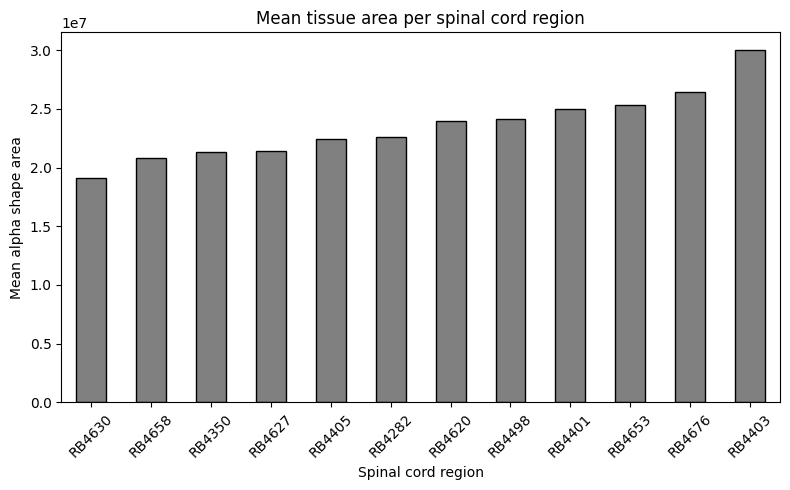

In [5]:
# Compute mean area
mean_area_per_region = ad.obs.groupby("sample_id")["area"].mean().sort_values()

# Plot
plt.figure(figsize=(8, 5))
mean_area_per_region.plot(kind="bar", color="gray", edgecolor="black")

plt.ylabel("Mean alpha shape area")
plt.xlabel("Spinal cord region")
plt.title("Mean tissue area per spinal cord region")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [18]:
ad.write('../../data/RREAE_5k_integration_scaled_clustered_annotated.h5ad')

In [16]:
sample_boundaries = {'S1-B1_1': 2220381.2261585603,
 'S1-B1_0': 2776160.885751081,
 'S1-B1_2': 4767067.083016609,
 'S1-B2_2': 2796689.211330664,
 'S1-B2_0': 2189906.06955851,
 'S1-B2_1': 4026511.449523496,
 'S1-B3_1': 3477937.015123812,
 'S1-B3_2': 2793499.99396823,
 'S1-B3_0': 2316344.2165113585,
 'S1-T1_1': 1968994.622687501,
 'S1-T1_2': 2397547.0134009724,
 'S1-T1_0': 3609443.3924932373,
 'S1-T2_0': 3218161.564378426,
 'S1-T2_2': 2011672.056776299,
 'S1-T2_1': 2767435.4697889374,
 'S1-T3_0': 3106099.5010814075,
 'S1-T3_2': 3981379.8450622703,
 'S1-T3_1': 2323940.5345225283,
 'S2-B1_1': 1799256.1928491404,
 'S2-B1_0': 3237811.341573274,
 'S2-B1_2': 2427250.113787201,
 'S2-B2_1': 26916.097866697834,
 'S2-B2_0': 1981593.628607253,
 'S2-B2_2': 3024250.620455357,
 'S2-B3_2': 2589758.0797127383,
 'S2-B3_0': 2083753.2163967644,
 'S2-B3_1': 3432408.41915359,
 'S2-T1_1': 4616066.060239144,
 'S2-T1_2': 3553508.854808196,
 'S2-T1_0': 3490323.722602542,
 'S2-T2_1': 3641773.649713396,
 'S2-T2_0': 2499646.3147111665,
 'S2-T2_2': 1792015.1856821412,
 'S2-T3_1': 1966395.383735338,
 'S2-T3_0': 3811591.6594006717,
 'S4-B1_0': 2389902.18977111,
 'S4-B1_2': 2655282.20814665,
 'S4-B1_1': 3416304.2322745034,
 'S4-B2_0': 4218586.291978832,
 'S4-B2_1': 2799128.122489919,
 'S4-B2_2': 2914500.658739235,
 'S4-B3_1': 3400622.350730942,
 'S4-B3_2': 2486073.1025240608,
 'S4-B3_0': 3966725.2693639225,
 'S4-T1_2': 2218361.4430688806,
 'S4-T1_0': 2601291.9390112963,
 'S4-T1_1': 3973597.176081915,
 'S4-T2_1': 4000688.2380513027,
 'S4-T2_0': 2514019.5915490864,
 'S4-T2_2': 2140937.2803360187,
 'S4-T3_2': 2372402.2140191775,
 'S4-T3_1': 3251298.914020284,
 'S4-T3_0': 2316653.2601173655,
 'S3-B1_1': 3923019.3477276326,
 'S3-B1_0': 3107486.900221684,
 'S3-B1_2': 3222921.57135793,
 'S3-B2_0': 2567565.1553539922,
 'S3-B2_1': 5192814.5968737975,
 'S3-B2_2': 1745526.2212366965,
 'S3-B3_1': 2677345.983871403,
 'S3-B3_2': 4124973.0775721977,
 'S3-B3_0': 3973407.143512229,
 'S3-T1_2': 3416654.4427931425,
 'S3-T1_0': 2423506.8783934577,
 'S3-T1_1': 2683067.5012378534,
 'S3-T2_1': 2921489.662314548,
 'S3-T2_0': 3464165.2658838104,
 'S3-T2_2': 2333169.145211075,
 'S3-T3_1': 2537815.972787508,
 'S3-T3_0': 3020764.7503401404,
 'S3-T3_2': 3926392.5640120013,
 'G3_L3_0': 3670936.699816095,
 'G3_L3_2': 4395317.049604974,
 'G3_L3_1': 4738420.11288241,
 'G5_L2_2': 2721057.672164584,
 'G5_L2_1': 2804574.6212469125,
 'G5_L2_0': 3222887.480373717,
 'G3_L2_2': 3008121.091166746,
 'G3_L2_1': 4354532.966685933,
 'G3_L2_0': 4339669.540781368,
 'G5_L1_1': 2223289.6460482865,
 'G5_L1_2': 2601306.291943037,
 'G5_L1_0': 2515250.130929071,
 'G3_L1_2': 4073225.9733664505,
 'G3_L1_1': 3876411.9088483686,
 'G3_L1_0': 5736489.2066999525,
 'G5_L3_2': 2967318.969906859,
 'G5_L3_0': 2919360.749011391,
 'G5_L3_1': 3133524.3096412937,
 'G4_L2_1': 3370361.788046071,
 'G4_L2_0': 3436612.960609812,
 'G4_L2_2': 3214518.662933759,
 'G6_L1_1': 3188215.1255825437,
 'G6_L1_2': 2276563.3549078335,
 'G6_L1_0': 2450383.8261921736,
 'G4_L3_1': 3393541.7527487576,
 'G4_L3_0': 3283314.7183990544,
 'G4_L3_2': 3867102.5132690477,
 'G6_L2_1': 2115774.1499310415,
 'G6_L2_2': 2560296.463173951,
 'G6_L2_0': 2299715.3287420464,
 'G6_L3_1': 4238390.691951181,
 'G6_L3_0': 2502968.997732842,
 'G6_L3_2': 4069171.2406200194,
 'G4_L1_1': 4292407.59308475,
 'G4_L1_0': 2679947.9793700133,
 'G4_L1_2': 1895904.916362427}

In [17]:
ad.obs['area'] = ad.obs.sample_id.map(sample_boundaries)
ad.obs["area"] = ad.obs["area"].astype(float)